In [204]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

# Hàm đếm băng Template Matching

In [205]:

def counting(img, template, THRESHOLD, proximity_threshold=50):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
    w, h = template.shape[1], template.shape[0]  # Template dimensions


    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img_gray, cmap='gray')
    axes[0].set_title("Original Image (Grayscale)")
    axes[0].axis('off')  

    axes[1].imshow(template_gray, cmap='gray')
    axes[1].set_title("Template (Grayscale)")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    #Matching template
    res = cv2.matchTemplate(img_gray, template_gray, cv2.TM_CCOEFF_NORMED)
    loc = np.where(res >= THRESHOLD)

    rectangles = []

    #Check close matching point
    def is_near_existing(x, y, rectangles, threshold):
        for rx, ry in rectangles:
            distance = np.sqrt((x - rx) ** 2 + (y - ry) ** 2)
            if distance < threshold:
                return True
        return False

    idx = 0
    for y, x in zip(*loc):
        if not is_near_existing(x, y, rectangles, proximity_threshold):
            cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)
            cv2.putText(img, str(idx + 1), (x, y + 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)
            rectangles.append((x, y))
            idx += 1

    fig, axes = plt.subplots(2, 1, figsize=(10, 20))

    axes[0].imshow(res)  
    axes[0].set_title("Template Matching Result")
    axes[0].axis('off')

    img_rgb_with_boxes = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[1].imshow(img_rgb_with_boxes)
    axes[1].set_title(f"Detected Objects: {idx}")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()



# ĐẾM CHIM

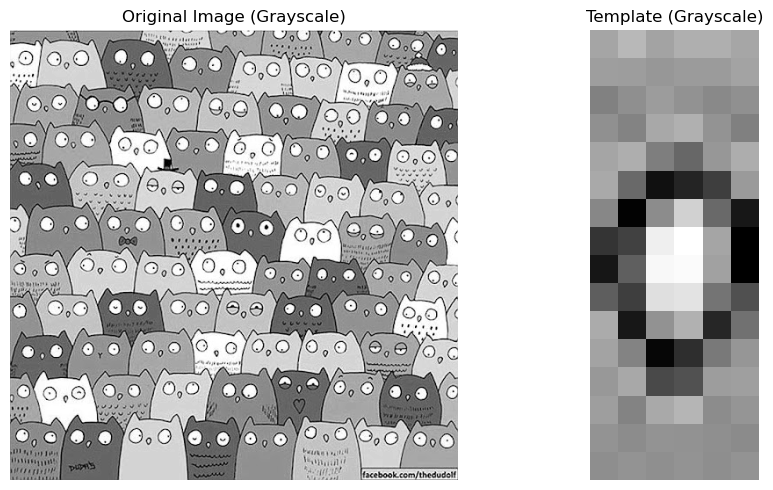

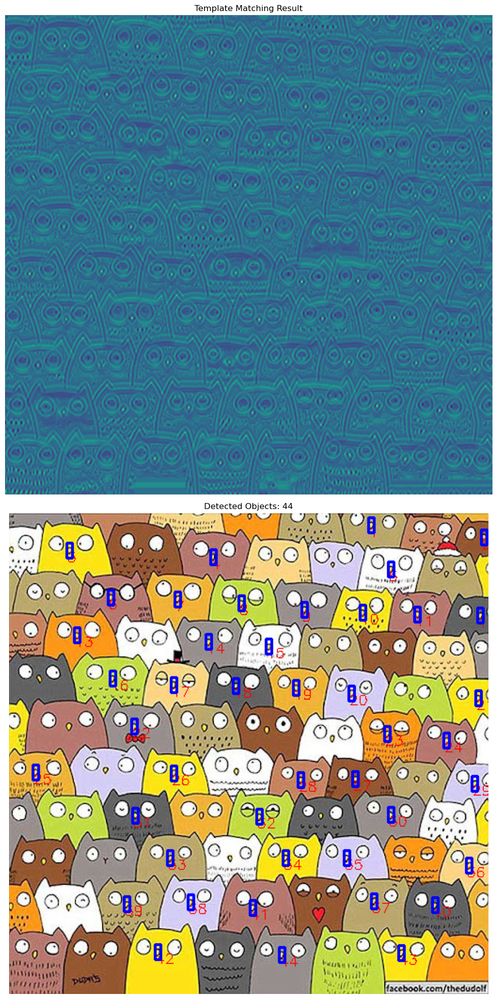

In [206]:
img = cv2.imread(r'Counting\\cat.png')
template = cv2.imread(r'Template\\cat_template.jpg')
threshole = 0.7
counting(img, template, threshole)

# ĐẾM CHUỘT

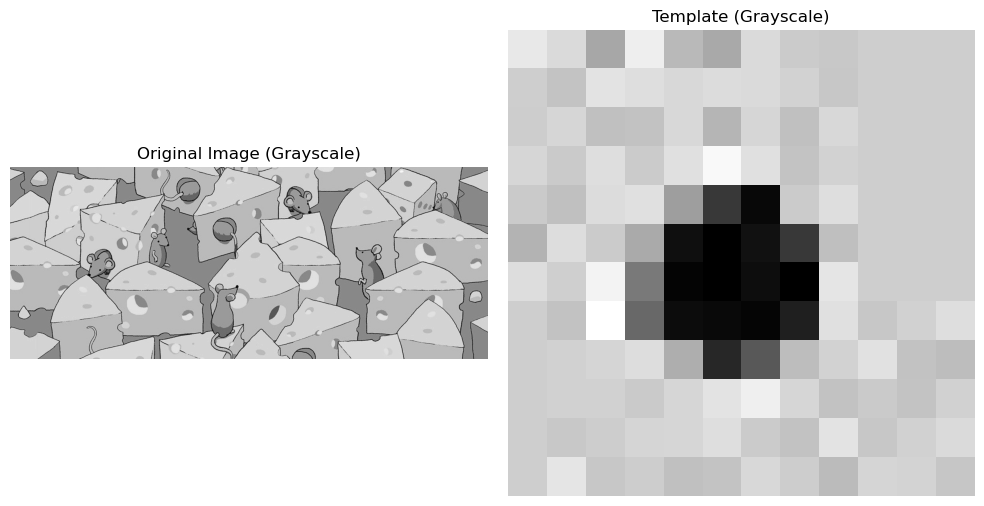

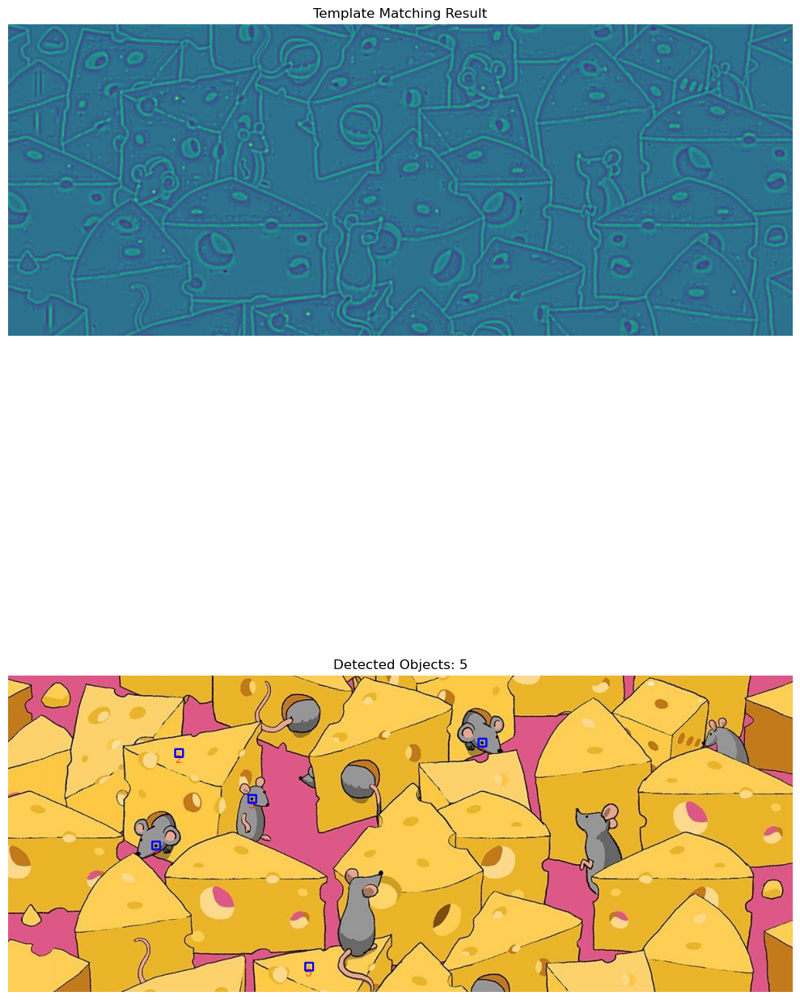

In [207]:
mouse = cv2.imread('Counting\\mouse.jpg')
mouse_template = cv2.imread('Template\\mouse_template.png')
mouse_th = 0.8

counting(mouse, mouse_template, mouse_th)

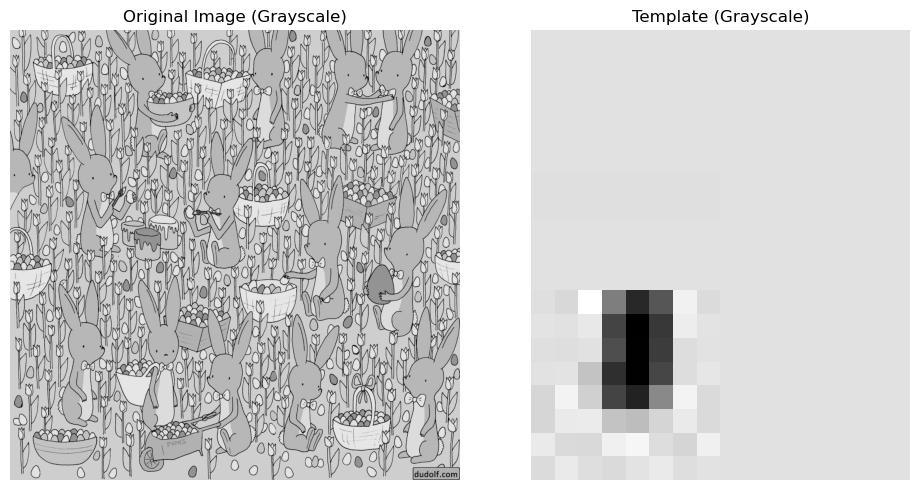

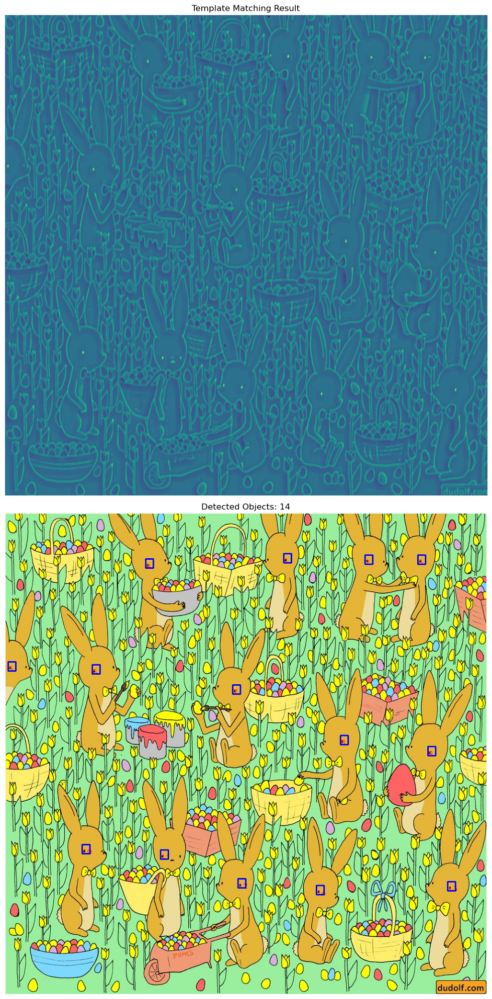

In [208]:
rabbit = cv2.imread('Counting\\rabbit.jpeg')
rabbit_template = cv2.imread('Template\\rabbit_template.png')
rabbit_th = 0.88

counting(rabbit, rabbit_template, rabbit_th)

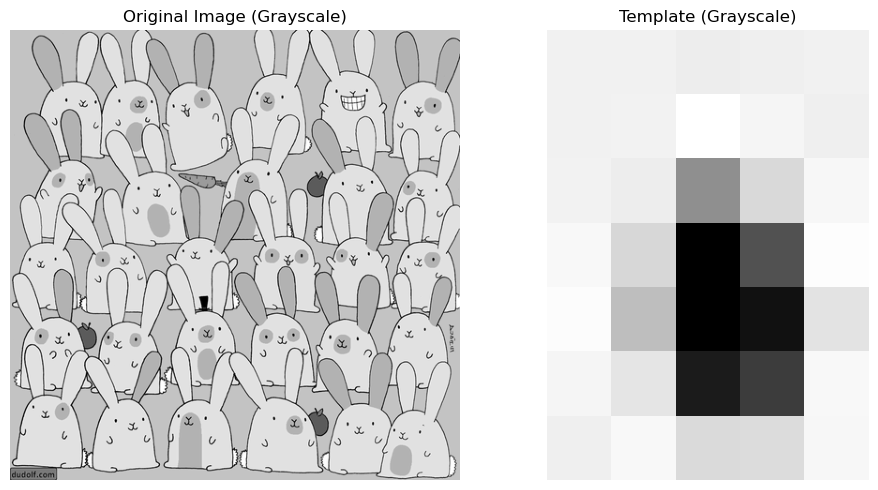

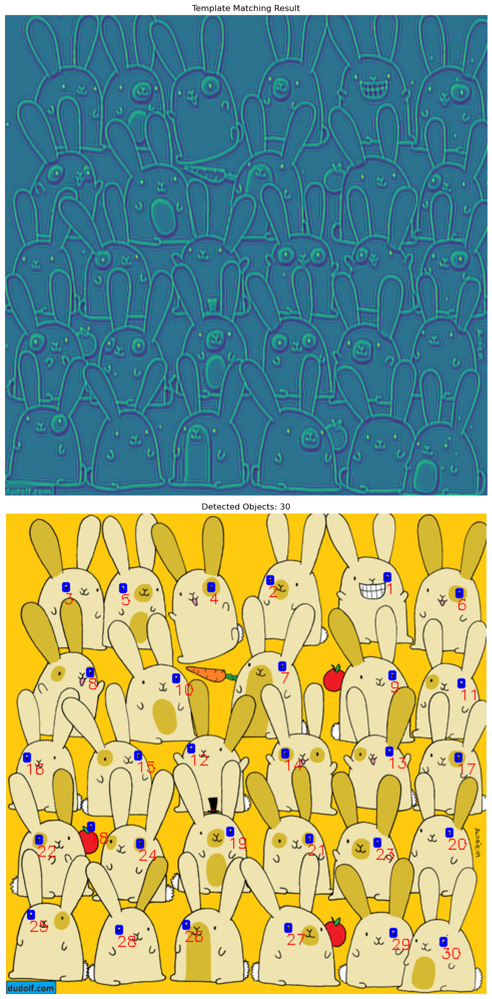

In [209]:
rabbit2 = cv2.imread('Counting\\rabbit2.png')
rabbit2_template = cv2.imread('Template\\rabbit2_template.png')
rabbit2_th = 0.8
counting(rabbit2, rabbit2_template, rabbit2_th)

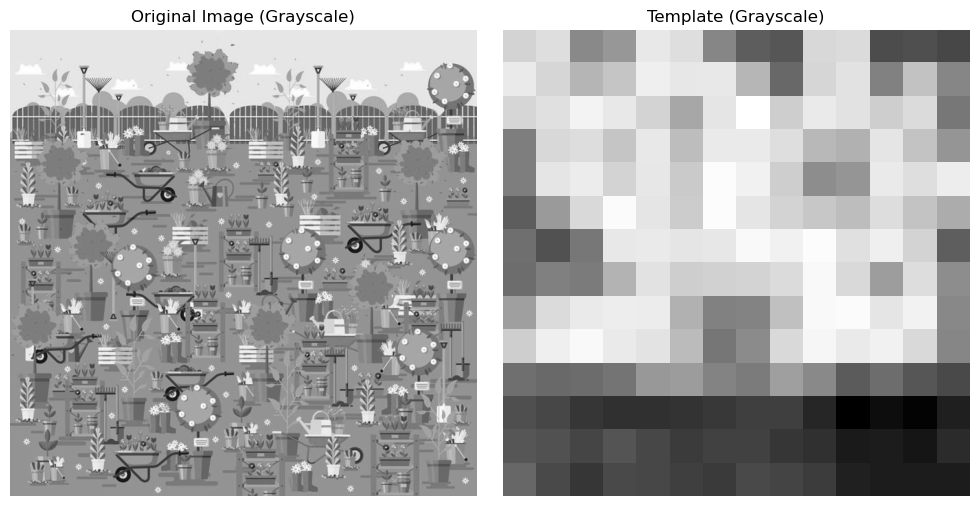

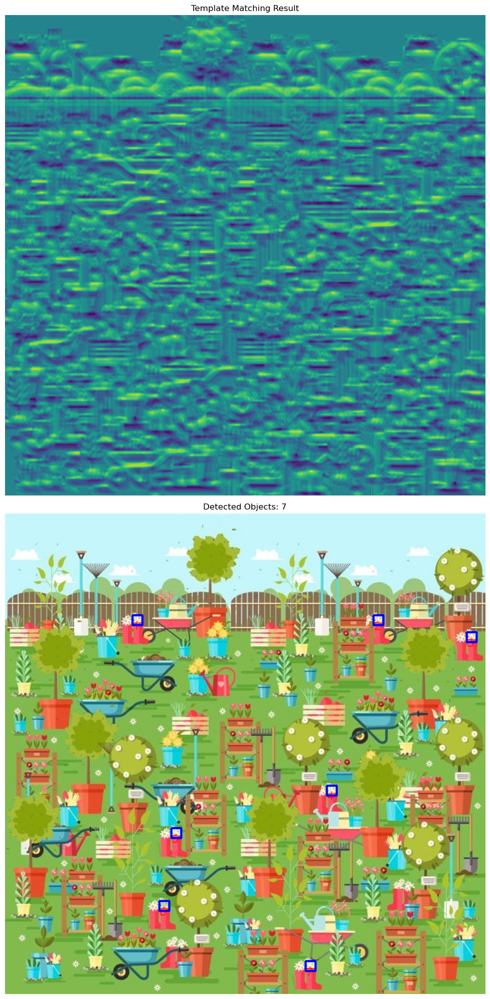

In [210]:
pair_boot = cv2.imread('Counting\\pair_boot.jpg')
pair_boot_template = cv2.imread('Template\\boot_pair_template.png')
pair_boot_th = 0.85
counting(pair_boot, pair_boot_template, pair_boot_th)